# CSCE5222.002 Assignment 2 <br>
Please download the images from the following link for this assignment <br>
https://drive.google.com/drive/folders/1LPspbBBDsvf5BdGdVrbMFHpqhH0yF8mg?usp=sharing <br>
The main purpose of this assignment is image retrieval. You will find 4 target images search_1.jpg to search_4.jpg and 50 data images from 1.jpg to 50.jpg. <br> **Try to retrieve the 5 most similar images from the data images to the target images, respectively, and display them.** <br>
Please refer to the following link for a simple application using VGG-16 for image retrieval. You can modify the feature extraction method for your assignment, or you can have your own code for this assignment.<br>
https://towardsdatascience.com/build-an-image-search-engine-using-python-ad181e76441b?gi=3714e721bc0 <br>
**Note: if you are required to pay for reviewing, please use a different browser to review it.**

## Task 1. Using only 1 feature descriptor for image retrieval
Please use only one feature descriptor for image retrival, for instance color layout feature, HOG feature, etc. <br>
**Note: if you are using the features like HOG, you may need to use correlation to measure the similarity.**

In [1]:
#write you code here
from PIL import Image as im
import cv2
import numpy as np
import os
import matplotlib.pyplot as plt
from collections import OrderedDict
from scipy.spatial import distance

In [2]:
def read_img(path):
    img_dat=[]
    entries = os.listdir(path)
    for entry in entries:
        pat = path + '\\' + entry
        da = cv2.imread(pat)
        img_dat.append(da)
    return img_dat

In [3]:
path = "/Users/laptopcheckout/Downloads/images"
path1 = "/Users/laptopcheckout/Downloads/search-images"

img_data=read_img(path)
search_data=read_img(path1)

In [4]:
def clf(dat):
    array=[0]*len(dat)
    icon=[0]*len(dat)
    m=0
    for img in dat:
        averages = np.zeros((8,8,3))
        imgH, imgW, _ = img.shape
        for row in range(8):
            for col in range(8):
                slice = img[imgH//8* row: imgH//8* (row+1), imgW//8*col : imgW//8*(col+1)]
                average_color_per_row = np.mean(slice, axis=0)
                average_color = np.mean(average_color_per_row, axis=0)
                average_color = np.uint8(average_color)
                averages[row][col][0] = average_color[0]
                averages[row][col][1] = average_color[1]
                averages[row][col][2] = average_color[2]
            icon[m] = cv2.cvtColor(np.array(averages, dtype=np.uint8), cv2.COLOR_BGR2YCR_CB)
        y, cr, cb = cv2.split(icon[m])
        dct_y = cv2.dct(np.float32(y))
        dct_cb = cv2.dct(np.float32(cb))
        dct_cr = cv2.dct(np.float32(cr))
        dct_y_zigzag = []
        dct_cb_zigzag = []
        dct_cr_zigzag = []
        flip = True
        flipped_dct_y = np.fliplr(dct_y)
        flipped_dct_cb = np.fliplr(dct_cb)
        flipped_dct_cr = np.fliplr(dct_cr)
        for i in range(8 + 8 -1):
            k_diag = 8 - 1 - i
            diag_y = np.diag(flipped_dct_y, k=k_diag)
            diag_cb = np.diag(flipped_dct_cb, k=k_diag)
            diag_cr = np.diag(flipped_dct_cr, k=k_diag)
            if flip:
                diag_y =  diag_y[::-1]
                diag_cb = diag_cb[::-1]
                diag_cr = diag_cr[::-1]
            dct_y_zigzag.append(diag_y)
            dct_cb_zigzag.append(diag_cb)
            dct_cr_zigzag.append(diag_cr)
            flip = not flip
        array[m]=np.concatenate([np.concatenate(dct_y_zigzag), np.concatenate(dct_cb_zigzag), np.concatenate(dct_cr_zigzag)])
        m+=1
    return array

In [5]:
search_clf=clf(search_data)
target_clf=clf(img_data)

<ipython-input-6-22695b5d2e35>:15: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure()


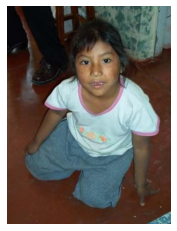

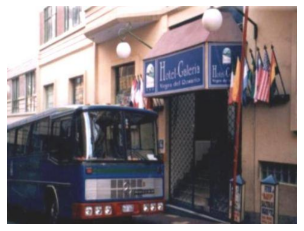

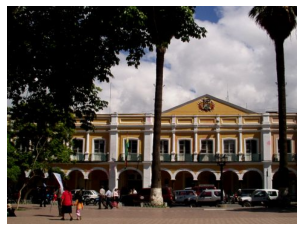

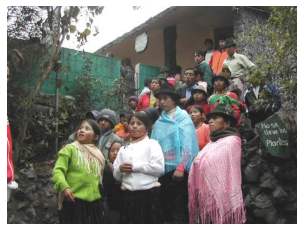

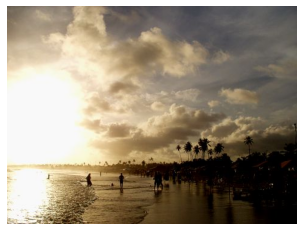

...

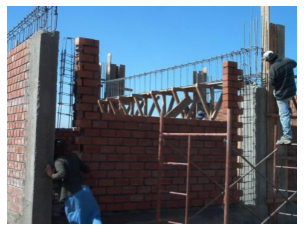

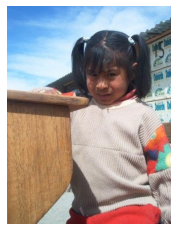

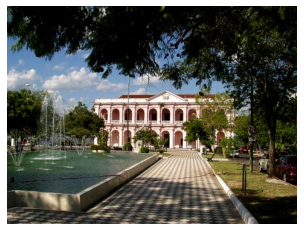

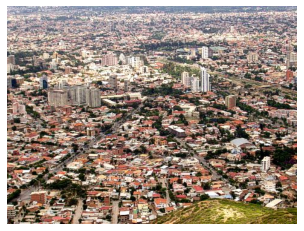

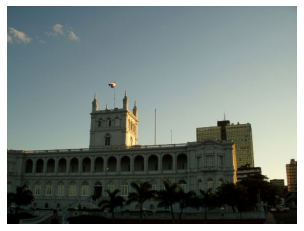

In [6]:
a=0
for i in search_clf:
    im=search_data[a] 
    plt.figure()
    plt.axis("off")
    plt.imshow(im[:,:,::-1])
    l2dist = list()
    arr_l1=list()
    count=0
    for t in target_clf:
        count+=1
        l2dist.append({"image":count,"value":np.linalg.norm(i-t,ord=2)})
    arr_l2=sorted(l2dist, key=lambda obj: obj["value"])[0:5]
    for j in arr_l2:
        plt.figure()
        plt.axis("off")
        k=str(j["image"])
        pat = path +'\\'+k+".jpg"
        da = cv2.imread(pat)
        plt.imshow(da[:,:,::-1])
    a+=1

## Task 2. Combining 2 feature descriptors for image retrieval
In this task, you need to use 2 different feature descriptors for image retrieval. <br>
If the two features are like the same type of color layout feature, you may need to concatenate them to one vector, then measure the similarity. For instance, feature 1 is a 1-by-N vector, feature 2 is a 1-by-M vector, then you may need to concatenate them to be a 1-by-(M+N) vector. If you mixed different types of features, try to assign weights to different features for similarity measurement.

In [63]:
import math
from abc import ABCMeta, abstractmethod
class Descriptor_Computer:
    _metaclass_ = ABCMeta

    @abstractmethod
    def compute(self, frame):
        pass
    
class Edge_Hist(Descriptor_Computer):

    def __init__(self, rows, cols):
        sqrt2 = math.sqrt(2)
        self.kernels = (np.matrix([[1,1],[-1,-1]]), \
                np.matrix([[1,-1],[1,-1]]),         \
                np.matrix([[sqrt2,0],[0,-sqrt2]]),  \
                np.matrix([[0,sqrt2],[-sqrt2,0]]),  \
                np.matrix([[2,-2],[-2,2]]));
        self.bins = [len(self.kernels)]
        self.range = [0,len(self.kernels)]
        self.rows = rows
        self.cols = cols
        self.prefix = "EDH"

    def compute(self, frame):
        frame = cv2.cvtColor(frame, cv2.COLOR_BGR2GRAY)
        descriptor = []
        dominant_Gradients = np.zeros_like(frame)
        max_Gradient = cv2.filter2D(frame, cv2.CV_32F, self.kernels[0])
        max_Gradient = np.absolute(max_Gradient)
        for k in range(1,len(self.kernels)):
            kernel = self.kernels[k]
            gradient = cv2.filter2D(frame, cv2.CV_32F, kernel)
            gradient = np.absolute(gradient)
            np.maximum(max_Gradient, gradient, max_Gradient)
            indices = (max_Gradient == gradient)
            dominant_Gradients[indices] = k

        frameH, frameW = frame.shape
        for row in range(self.rows):
            for col in range(self.cols):
                mask = np.zeros_like(frame)
                mask[((frameH//self.rows)*row):((frameH//self.rows)*(row+1)),(frameW//self.cols)*col:((frameW//self.cols)*(col+1))] = 255
                hist = cv2.calcHist([dominant_Gradients], [0], mask, self.bins, self.range)
                hist = cv2.normalize(hist, None)
                descriptor.append(hist)
                n=[]
                for x in descriptor:
                    for j in x:
                        for k in j:
                            n.append(k*20)
        return n

In [68]:
edge_target_arr=[]
for i in img_dat:
    comp=Edge_Hist(8,8)
    t=comp.compute(i)
    edge_target_arr.append(t)
edge_search_array=[]
for i in search_dat:
    comp=Edge_Hist(8,8)
    t=comp.compute(i)
    edge_search_array.append(t)

In [69]:
search_final=[0]*len(edge_search_array)
target_final=[0]*len(edge_target_arr)
for n in range (0,len(edge_search_array)):
    search_final[n]=np.concatenate([search_clf[n],edge_search_array[n]])
for n in range (0,len(edge_target_arr)):
    target_final[n]=np.concatenate([target_clf[n],edge_target_arr[n]])

<ipython-input-67-5600a2cfd9df>:15: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure()


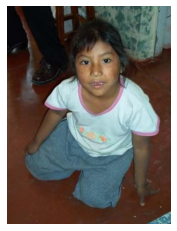

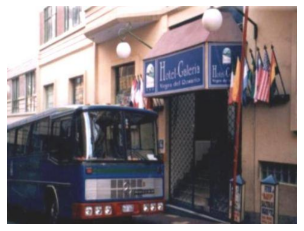

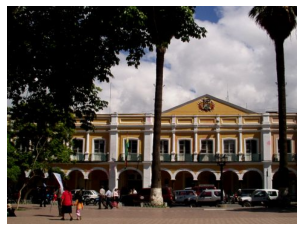

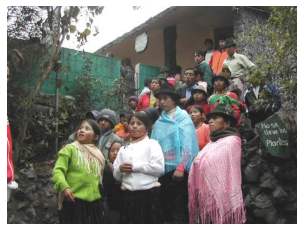

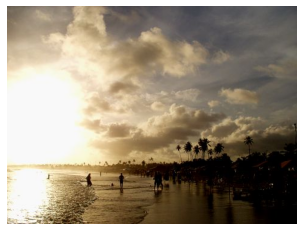

...

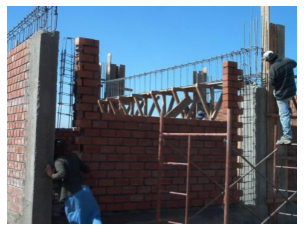

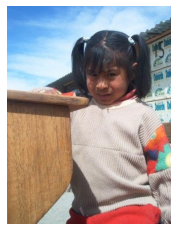

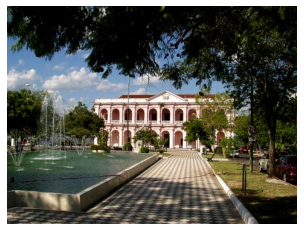

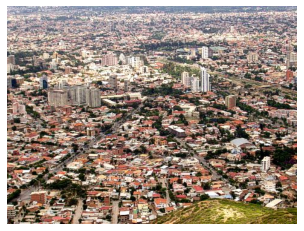

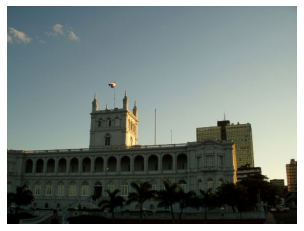

In [67]:
a=0
for i in search_final:
    im=search_dat[a] 
    plt.figure()
    plt.axis("off")
    plt.imshow(im[:,:,::-1])
    l2dist = list()
    arr_l1=list()
    count=0
    for t in target_final:
        count+=1
        l2dist.append({"image":count,"value":np.linalg.norm(i-t,ord=2)})
    arr_l2=sorted(l2dist, key=lambda obj: obj["value"])[0:5]
    for j in arr_l2:
        plt.figure()
        plt.axis("off")
        k=str(j["image"])
        pat = path +'\\'+k+".jpg"
        da = cv2.imread(pat)
        plt.imshow(da[:,:,::-1])
    a+=1

## Task 3. Try to apply Convolutional fiter to the images first, then using combined feature descriptor for image retrieval.
In this task, you need to apply one Convolutional fiter to the images first. You can select any type of convolutional kernel. Then apply the the combined feature descriptor for image retrieval

<ipython-input-71-a8f67b851488>:46: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure()


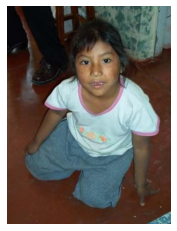

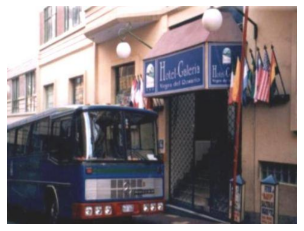

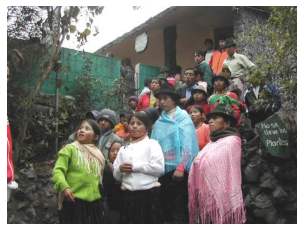

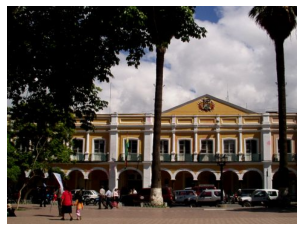

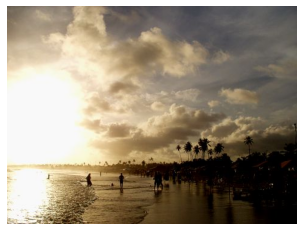

...

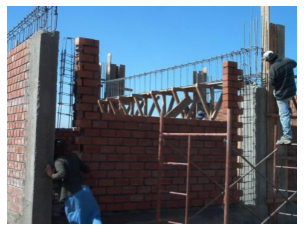

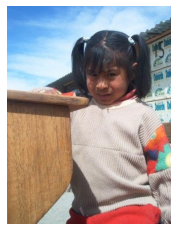

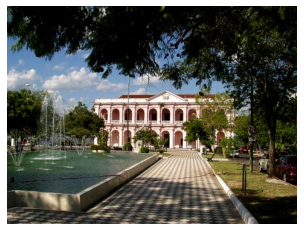

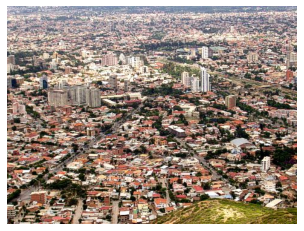

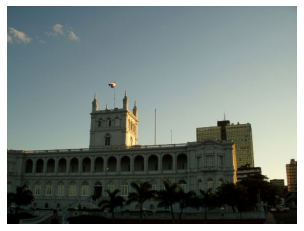

In [71]:
#write your code here
import numpy as np
import cv2
import matplotlib.pyplot as plt
flt_search_data=[]
flt_target_data=[]
for i in search_dat:
    flt=cv2.GaussianBlur(i,(7,7), 0)
    flt_search_data.append(flt)
for i in img_dat:
    flt=cv2.GaussianBlur(i,(7,7), 0)
    flt_target_data.append(flt)

search_clf=clf(flt_search_data)
target_clf=clf(flt_target_data)
edge_target_arr=[]
for i in flt_target_data:
    comp=Edge_Hist(8,8)
    t=comp.compute(i)
    edge_target_arr.append(t)
edge_search_array=[]
for i in flt_search_data:
    comp=Edge_Hist(8,8)
    t=comp.compute(i)
    edge_search_array.append(t)
search_final=[0]*len(edge_search_array)
target_final=[0]*len(edge_target_arr)
for n in range (0,len(edge_search_array)):
    search_final[n]=np.concatenate([search_clf[n],edge_search_array[n]])
for n in range (0,len(edge_target_arr)):
    target_final[n]=np.concatenate([target_clf[n],edge_target_arr[n]])
a=0
for i in search_final:
    im=search_dat[a] 
    plt.figure()
    plt.axis("off")
    plt.imshow(im[:,:,::-1])
    l2dist = list()
    arr_l1=list()
    count=0
    for t in target_final:
        count+=1
        l2dist.append({"image":count,"value":np.linalg.norm(i-t,ord=2)})
    arr_l2=sorted(l2dist, key=lambda obj: obj["value"])[0:5]
    for j in arr_l2:
        plt.figure()
        plt.axis("off")
        k=str(j["image"])
        pat = path +'\\'+k+".jpg"
        da = cv2.imread(pat)
        plt.imshow(da[:,:,::-1])
    a+=1